# Experimental Concerns for Beam Measurement

**Scott Prahl**

**Nov 2025**

Many mistakes can be made when making a beam measurement.  This notebook collects a number of these.

The ISO 11146 standard recommends masking the image with a rotated rectangular mask around the center of the image.  This notebook explains how that was implemented and then shows some results for artifically generated images of non-circular Gaussian beams. As noise increases, the first-order parameters (beam center) are robust, but the second-order parameters (diameters) are shown to be much more sensitive to image noise.


In [1]:
%config InlineBackend.figure_format = 'retina'

import sys
import imageio.v3 as iio
import numpy as np
import matplotlib.pyplot as plt

if sys.platform == "emscripten":
    import piplite

    await piplite.install("laserbeamsize")

import laserbeamsize as lbs

import warnings

warnings.filterwarnings("error", category=UserWarning)  # Make YOUR warnings into errors
warnings.filterwarnings("ignore", category=DeprecationWarning, module="traitlets")

In [2]:
if sys.platform == "emscripten":
    repo = "images/"
else:
    repo = "https://github.com/scottprahl/laserbeamsize/raw/main/docs/images/"

In [3]:
def side_by_side_plot(h, v, xc, yc, d_major, d_minor, phi, noise=0):
    """Creates plot of original and of fitted beam."""
    test = lbs.create_test_image(h, v, xc, yc, d_major, d_minor, phi, noise=noise)
    xc_found, yc_found, d_major_found, d_minor_found, phi_found = lbs.beam_size(test, iso_noise=True)

    plt.subplots(1, 2, figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(test, cmap=lbs.create_plus_minus_cmap(test))
    plt.plot(xc, yc, "ob", markersize=2)
    plt.title(
        r"Original (%d,%d), d_major=%.0f, d_minor=%.0f, $\phi$=%.0f°"
        % (xc, yc, d_major, d_minor, np.degrees(phi))
    )

    plt.subplot(1, 2, 2)
    plt.imshow(test, cmap="gist_ncar")
    xp, yp = lbs.rotated_rect_arrays(xc_found, yc_found, d_major_found, d_minor_found, phi_found)
    plt.plot(xp, yp, ":y")
    xp, yp = lbs.ellipse_arrays(xc_found, yc_found, d_major_found, d_minor_found, phi_found)
    plt.plot(xp, yp, ":b")
    plt.plot(xc_found, yc_found, "ob", markersize=2)
    plt.title(
        r"Found (%d,%d), d_major=%.0f, d_minor=%.0f, $\phi$=%.0f°"
        % (xc_found, yc_found, d_major_found, d_minor_found, np.degrees(phi_found))
    )


pixel_size_µm = 3.75  # microns

## Image of beam is saturated

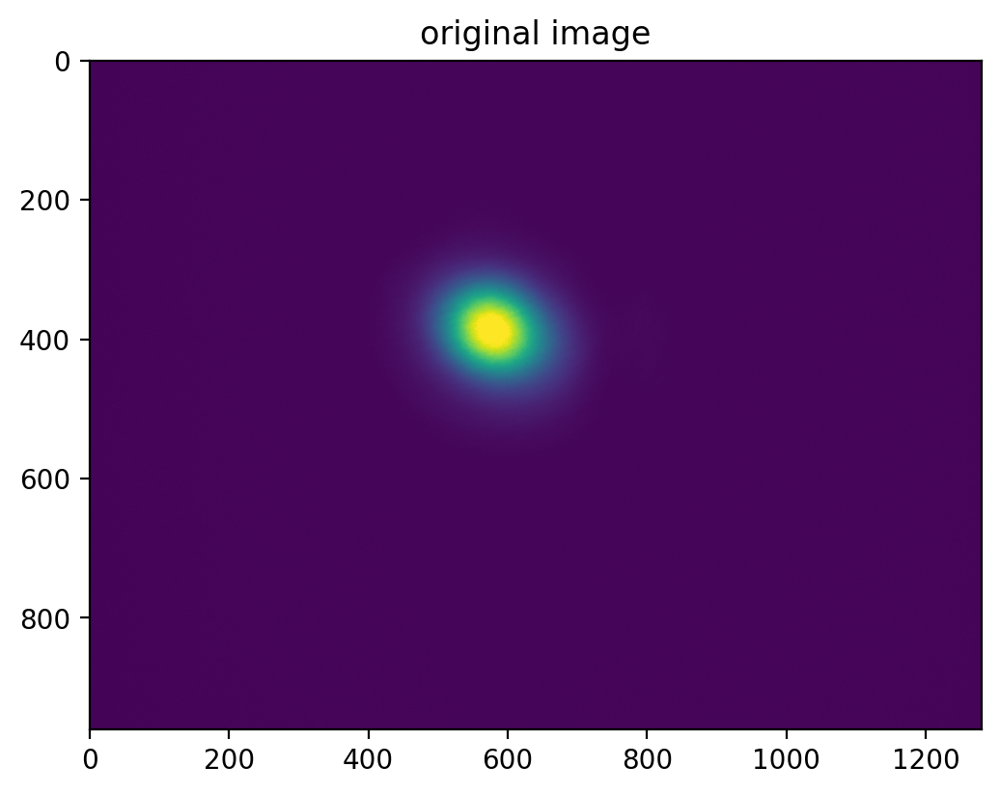

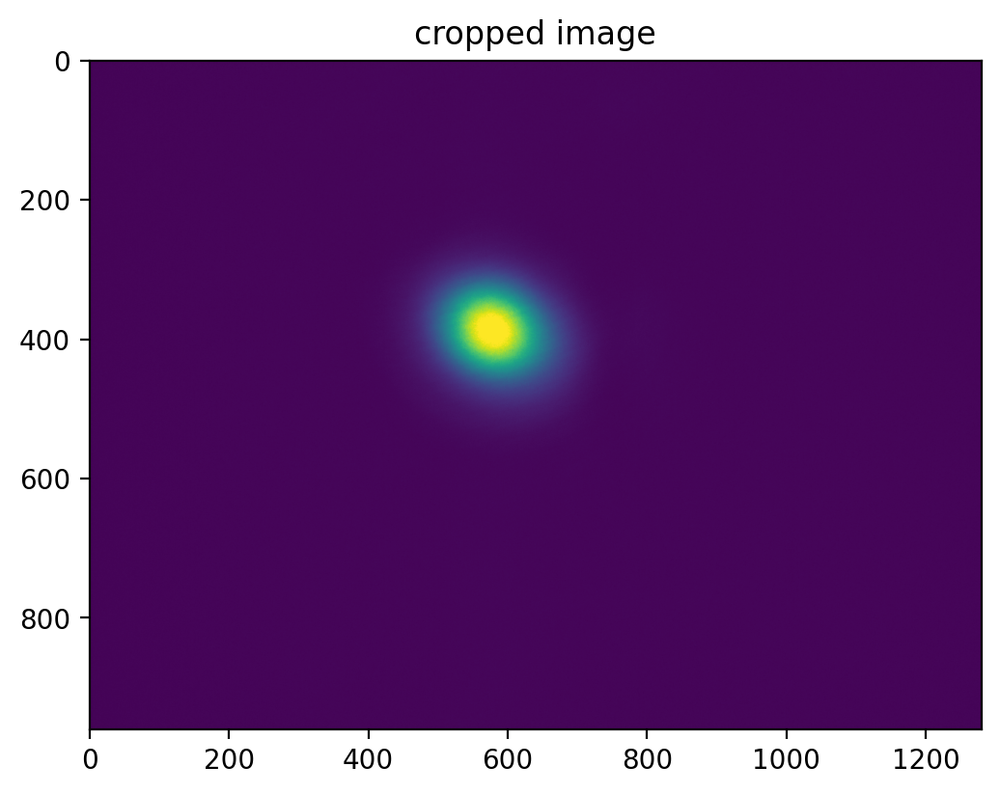

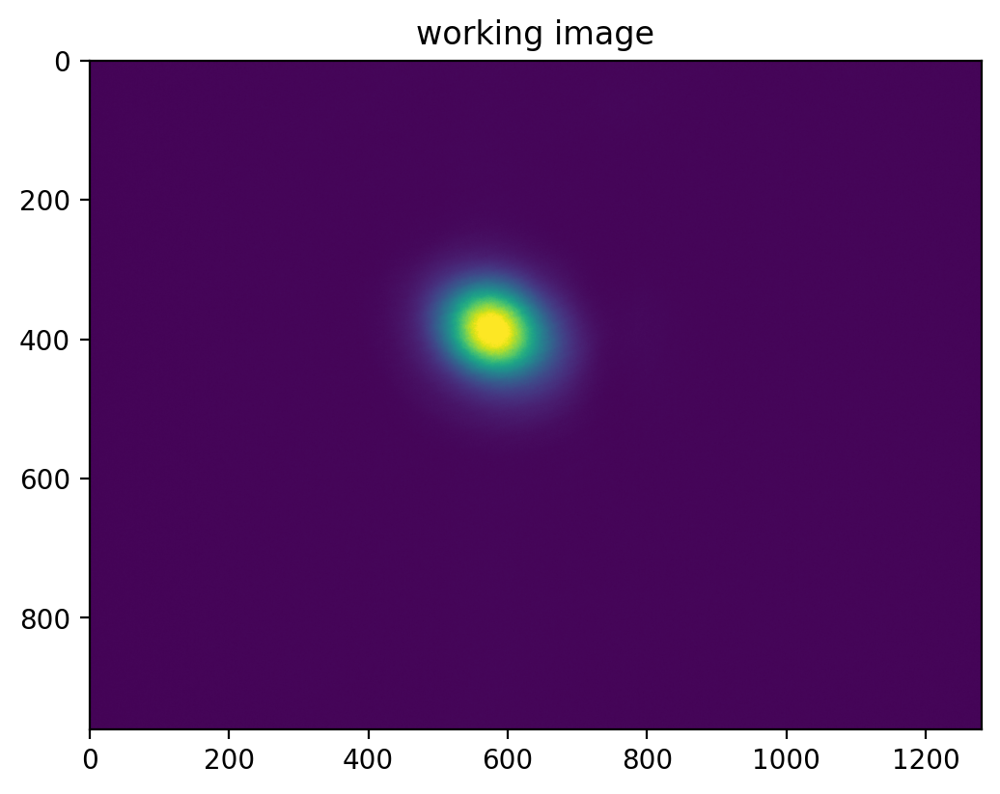

D_MINOR= 192.54507933239464
[332.00128024 832.72792861] [166.3325937  612.17218803] [774.25857308 390.47063577] [173.73446695 604.77031478]
[-938.86246568  938.86246568] [-835.94923937  835.94923937]
[ 719.60238247 -719.60238247] [-808.19221467  808.19221467]
[  5.   5.   5.   6.   6.   5.   5.   5.   4.   6.   7.   5.   5.   6.
   6.   6.   5.   6.   5.   6.   5.   5.   5.   5.   7.   6.   6.   5.
   5.   4.   6.   6.   5.   5.   5.   4.   5.   5.   5.   5.   5.   5.
   6.   4.   5.   5.   6.   5.   5.   5.   5.   5.   5.   5.   6.   6.
   5.   5.   6.   4.   5.   6.   5.   4.   5.   4.   6.   5.   6.   5.
   6.   6.   6.   6.   5.   6.   6.   4.   5.   5.   5.   6.   5.   5.
   5.   5.   5.   6.   5.   5.   5.   5.   5.   5.   6.   6.   5.   6.
   4.   6.   4.   7.   5.   6.   6.   4.   6.   6.   5.   5.   6.   6.
   7.   7.   6.   7.   6.   6.   6.   7.   6.   7.   8.   8.   7.   8.
   7.   8.   9.   8.  10.   8.   9.   8.   9.   9.  10.  11.  10.  11.
  12.  12.  13.  13.  13.  13.

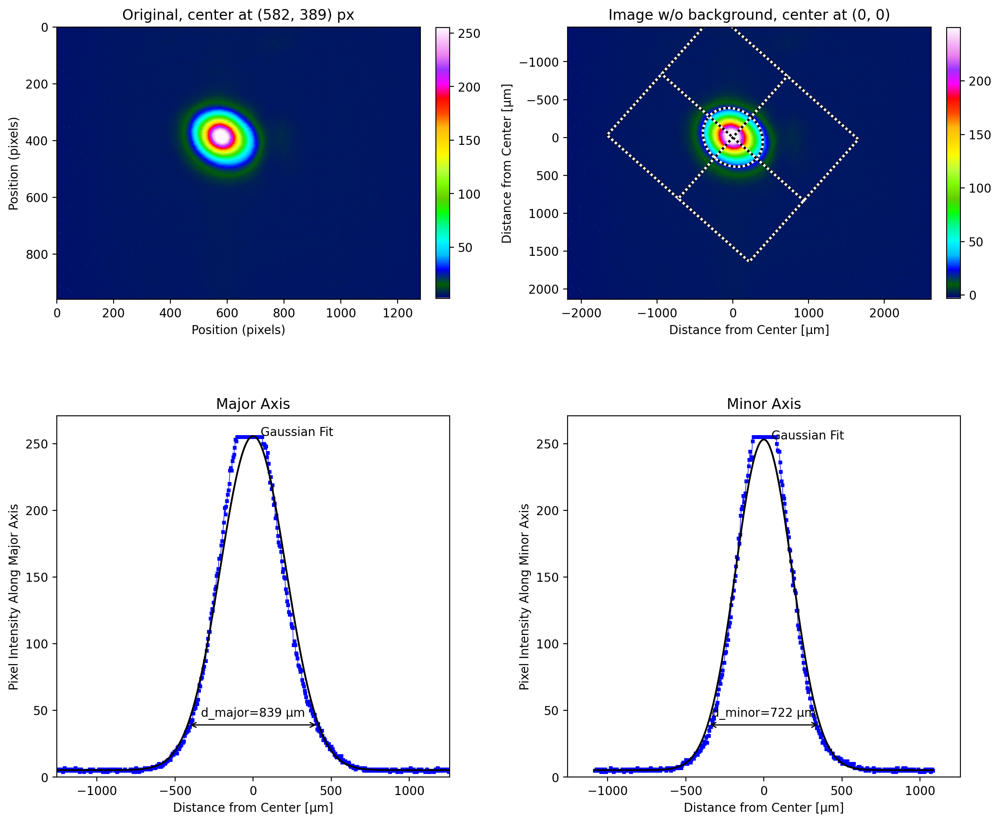

In [4]:
sat_img = iio.imread(repo + "k-200mm.png")
lbs.plot_image_analysis(sat_img, pixel_size=pixel_size_µm)

## Image of beam is too small

To illustrate we create a 20x40 pixel beam in a 600x600 image and a 200x200 image.  2% noise is added to the image and we try to extract the beam parameters.  The beam in the larger image fails and the smaller image succeeds.

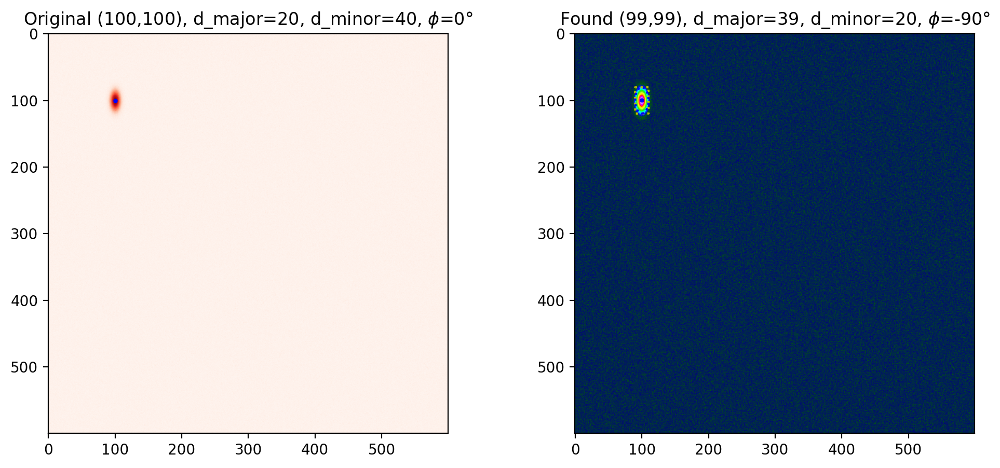

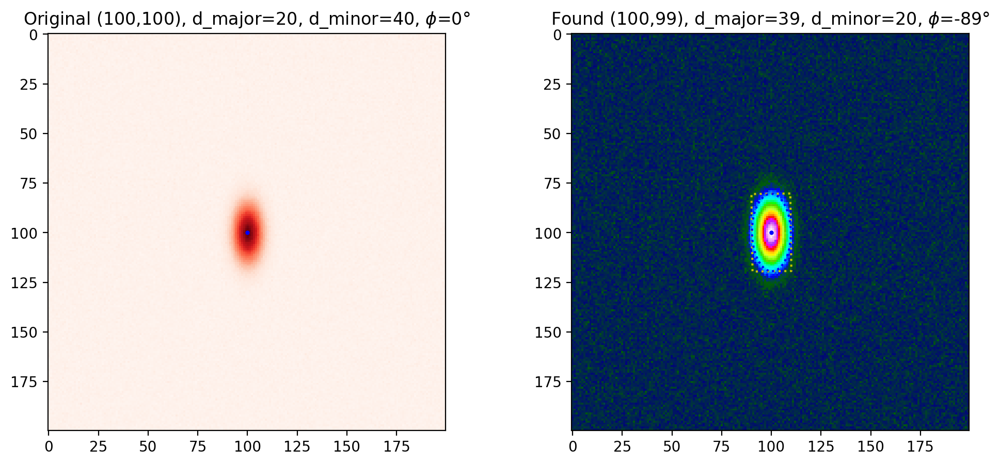

In [5]:
h, v, xc, yc, d_major, d_minor, phi = 600, 600, 100, 100, 20, 40, 0
side_by_side_plot(h, v, xc, yc, d_major, d_minor, phi, noise=5)
h, v, xc, yc, d_major, d_minor, phi = 200, 200, 100, 100, 20, 40, 0
side_by_side_plot(h, v, xc, yc, d_major, d_minor, phi, noise=5)

## Image of beam is too large

The algorithm does not do too badly with these.  Here artifical beams 250x250 pixels in size are placed in 250x250 images or 900x900 images.  No noise is added.  The beam in the small image results in 192x181 pixel beam, while the larger image generates a 245x245 pixel beam.

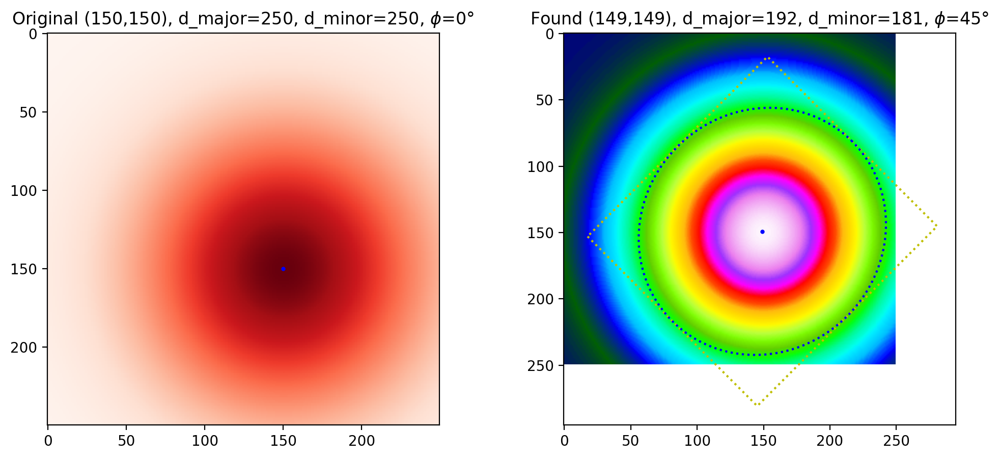

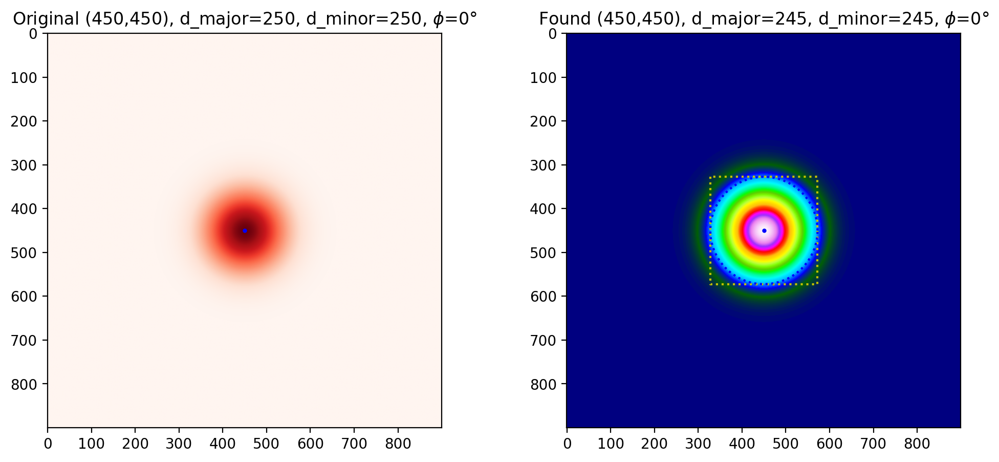

In [6]:
h, v, xc, yc, d_major, d_minor, phi = 250, 250, 150, 150, 250, 250, 0
side_by_side_plot(h, v, xc, yc, d_major, d_minor, phi, noise=0)
h, v, xc, yc, d_major, d_minor, phi = 900, 900, 450, 450, 250, 250, 0
side_by_side_plot(h, v, xc, yc, d_major, d_minor, phi, noise=0)

## Image of beam is too close to margins

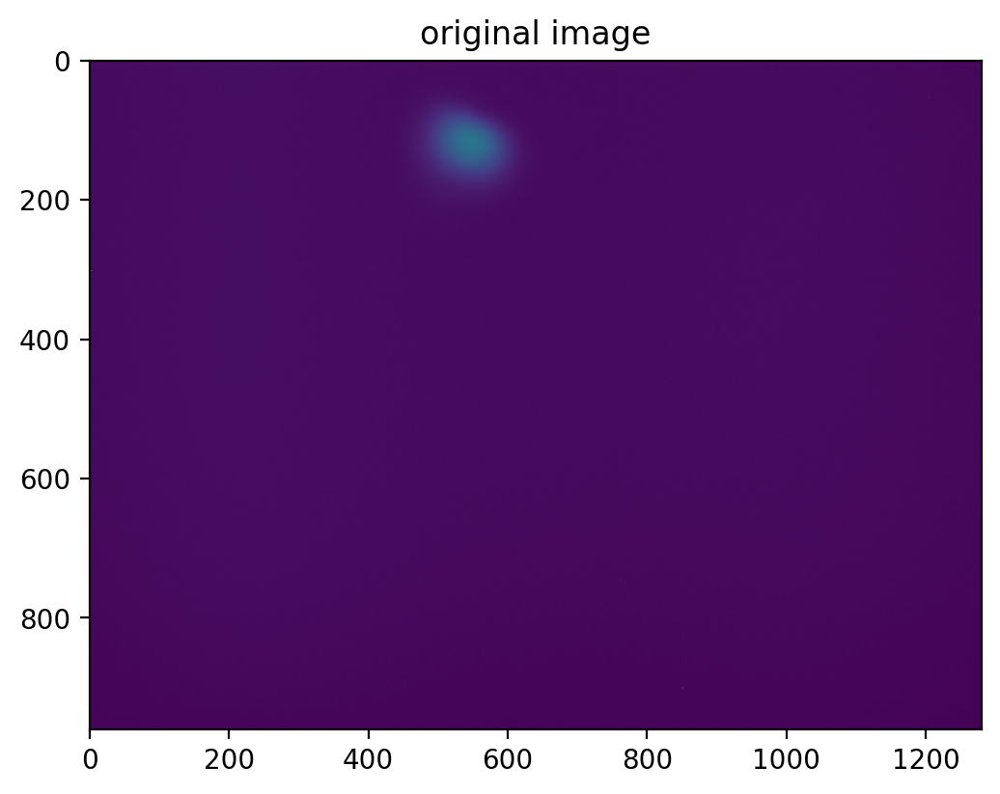

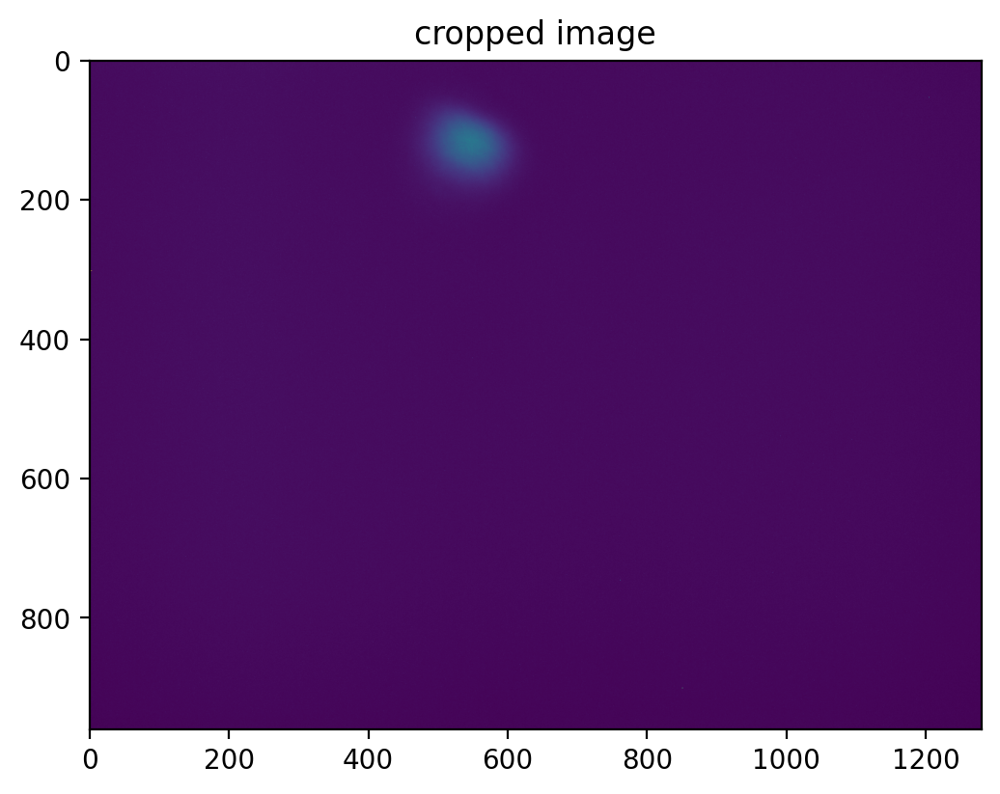

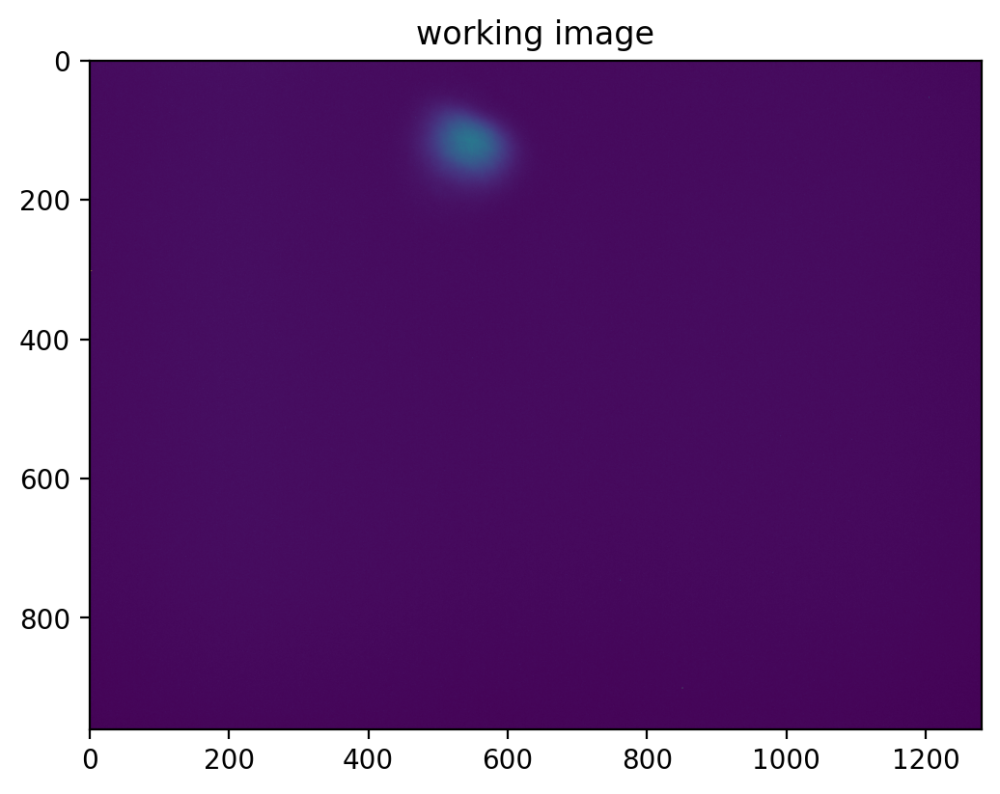

D_MINOR= None
[-623.0979614123523 1573.8604752157219] [19.4177127400256 114.410635925567] [None None] [None None]
[-4119.297068677639 4119.297068677639] [-178.1117309728901 178.11173097289011]
[228. 224. 222. ... 203. 234. 217.]
72.89721073640447 225.62802848742197
1374.6944673150203 235.49359314959233


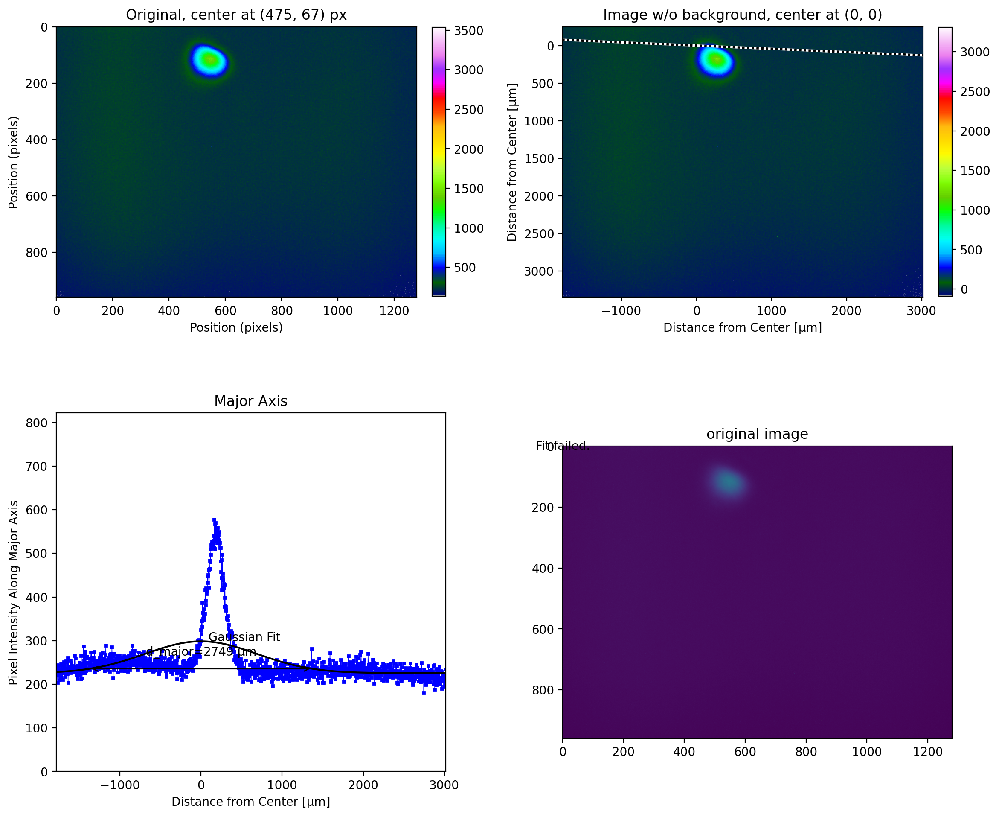

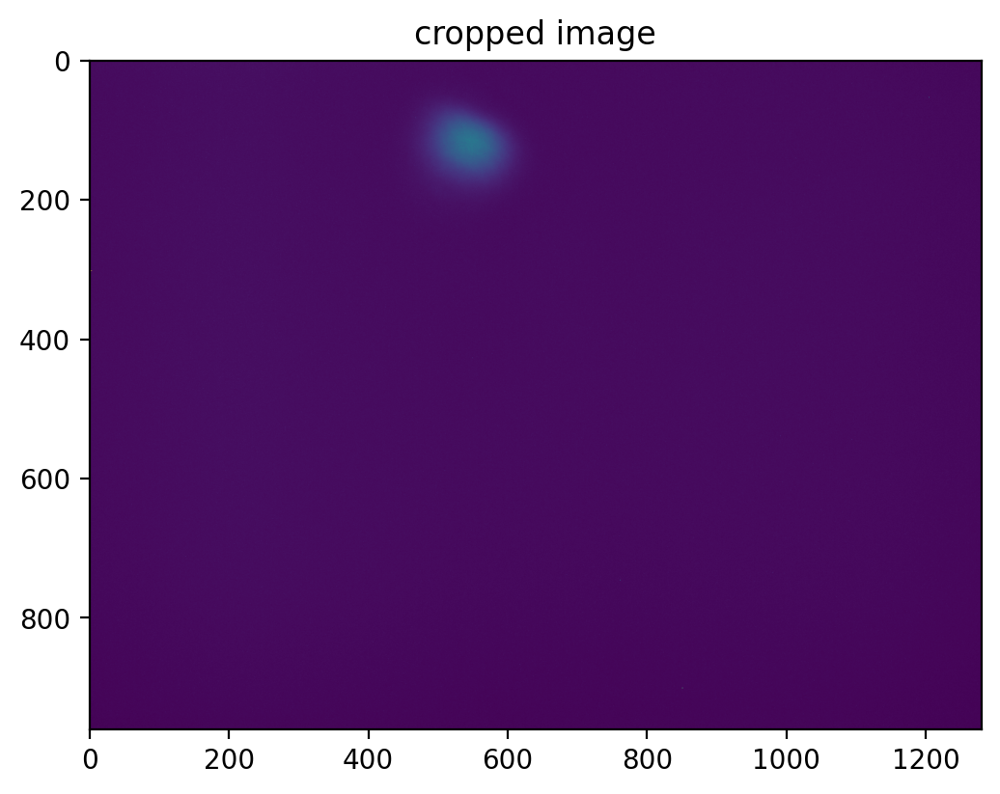

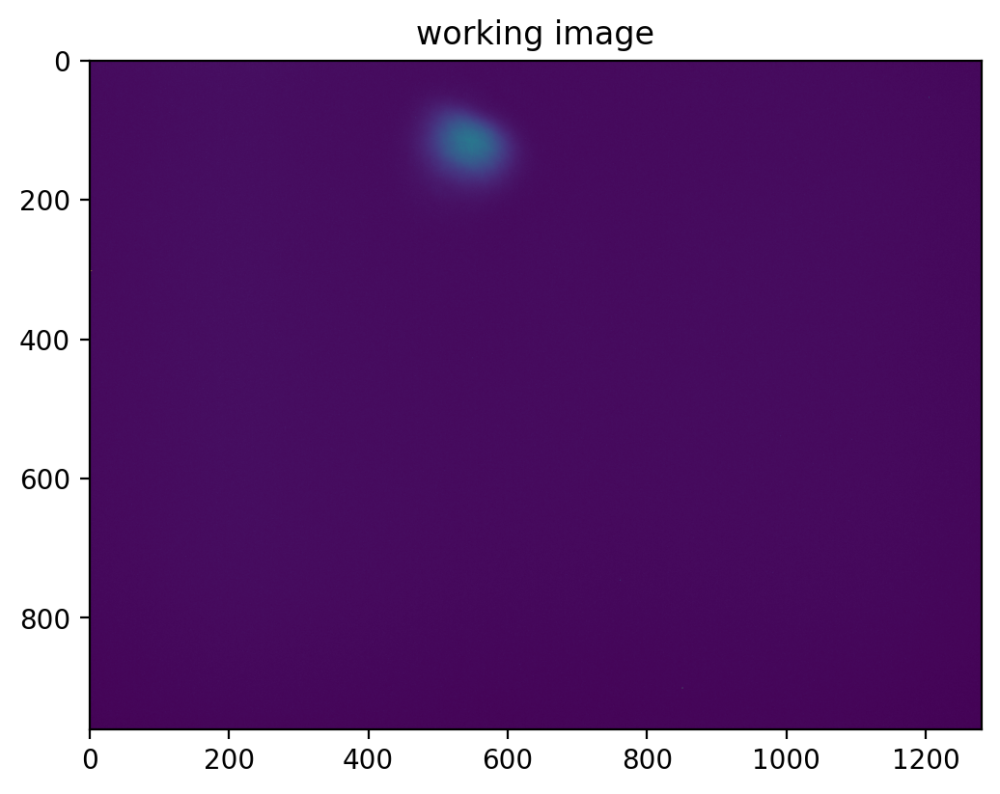

D_MINOR= 113.47933421031763
[347.63911591 732.5074577 ] [ 44.26887792 200.77824382] [604.10070355 476.04587005] [-34.92468876 279.9718105 ]
[-721.62814086  721.62814086] [-293.45506107  293.45506107]
[ 240.10281281 -240.10281281] [-590.43093613  590.43093613]
[ 251.  229.  236.  232.  245.  230.  255.  235.  251.  242.  243.  227.
  241.  253.  231.  249.  242.  253.  255.  225.  236.  276.  254.  246.
  242.  236.  245.  240.  225.  268.  249.  247.  227.  228.  231.  246.
  247.  249.  235.  228.  239.  238.  240.  250.  254.  243.  248.  237.
  230.  252.  228.  237.  231.  226.  238.  232.  236.  226.  213.  223.
  244.  250.  214.  236.  237.  258.  241.  228.  251.  232.  230.  251.
  237.  238.  237.  234.  245.  242.  237.  246.  218.  240.  235.  226.
  246.  238.  252.  247.  237.  242.  246.  264.  247.  231.  229.  265.
  234.  273.  238.  274.  263.  290.  254.  282.  282.  266.  287.  274.
  281.  289.  304.  298.  288.  311.  309.  316.  295.  338.  319.  329.
  328.  35

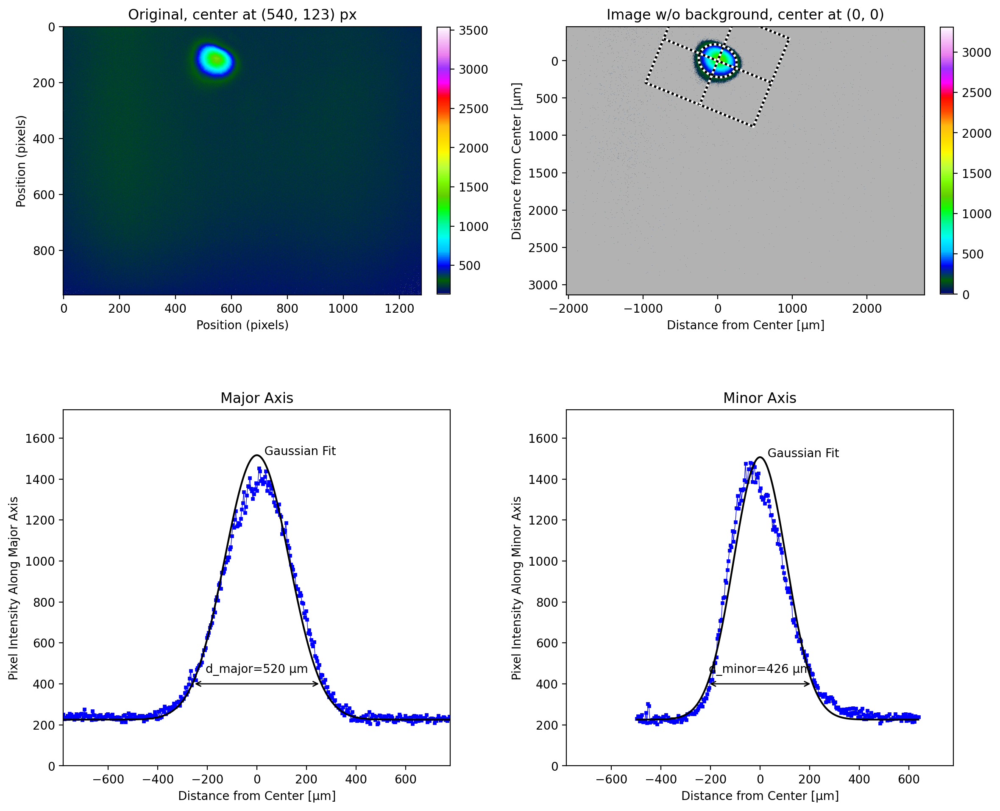

In [7]:
margin_img = iio.imread(repo + "TEM00_300mm.pgm") >> 4

options = {"pixel_size": pixel_size_µm, "units": "µm"}
lbs.plot_image_analysis(margin_img, **options)

# works a bit better with iso_noise=False
lbs.plot_image_analysis(margin_img, **options, iso_noise=False)

## Image has artifacts, example 1

With the standard color map it is not obvious why the vertical dimension is nuts.

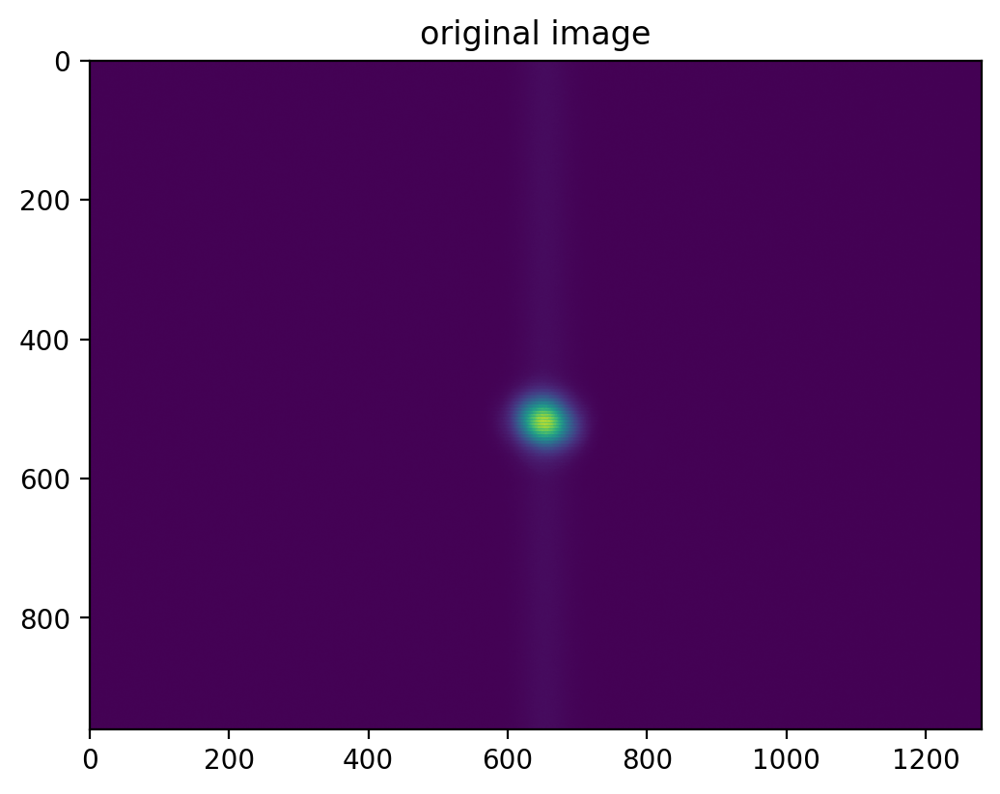

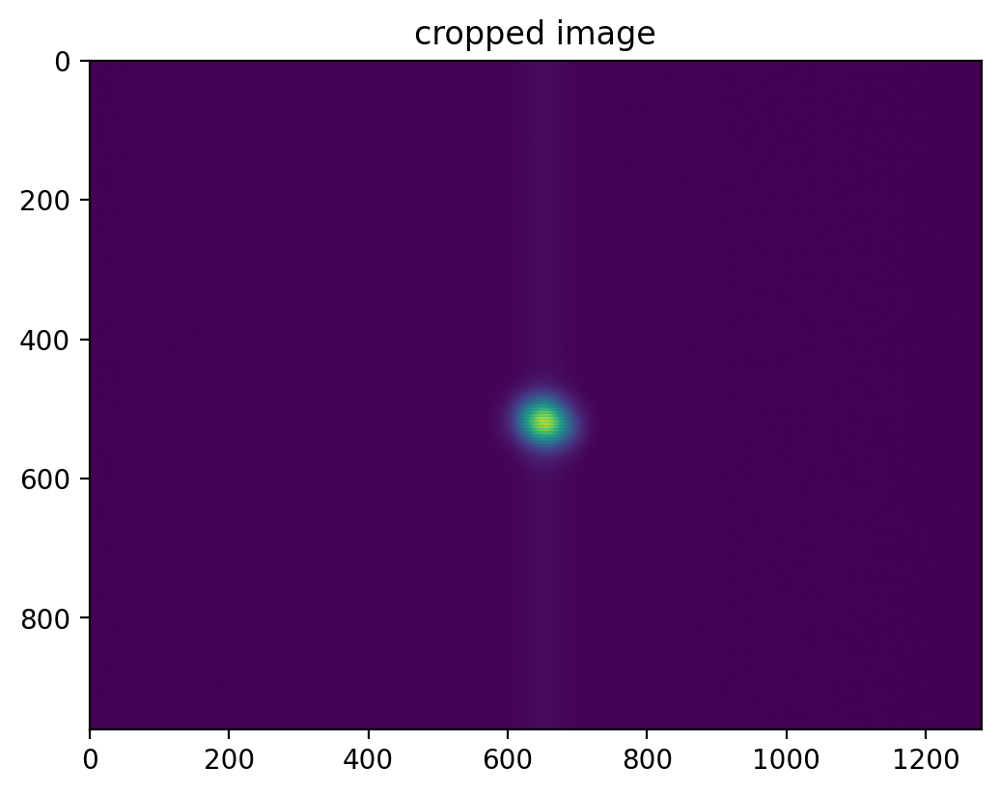

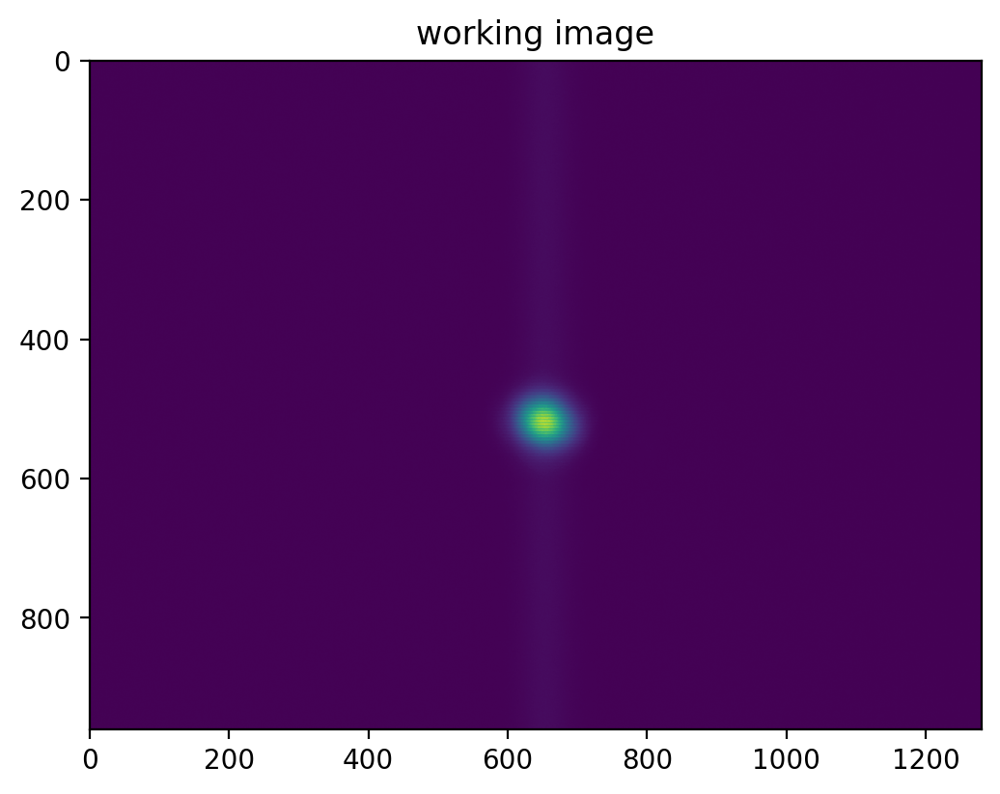

D_MINOR= 101.28353620892358
[650.39234391 652.87676252] [-476.37971147 1487.04389748] [803.3097361  499.95937032] [505.14017077 505.52401524]
[-4.6582849  4.6582849] [-3681.41926678  3681.41926678]
[ 568.78193583 -568.78193583] [-0.71970838  0.71970838]
[  7.   6.   7.   7.   6.   7.   6.   6.   6.   7.   8.   7.   7.   7.
   7.   7.   7.   6.   7.   7.   7.   7.   7.   7.   7.   6.   7.   7.
   7.   7.   7.   7.   8.   6.   7.   7.   6.   7.   6.   7.   7.   6.
   7.   7.   7.   6.   6.   7.   8.   5.   6.   7.   8.   6.   7.   8.
   6.   8.   6.   6.   7.   6.   6.   7.   7.   7.   7.   7.   6.   8.
   7.   7.   7.   7.   7.   6.   6.   6.   6.   7.   7.   8.   6.   8.
   7.   7.   6.   7.   7.   7.   7.   7.   8.   6.   7.   7.   7.   9.
   7.   7.   7.   6.   6.   6.   7.   7.   7.   6.   7.   7.   8.   7.
   7.   7.   8.   6.   8.   6.   7.   7.   7.   7.   7.   8.   7.   7.
   7.   7.   6.   7.   7.   7.   7.   8.   7.   7.   6.   7.   7.   7.
   7.   7.   7.   7.   7.   7.   6. 

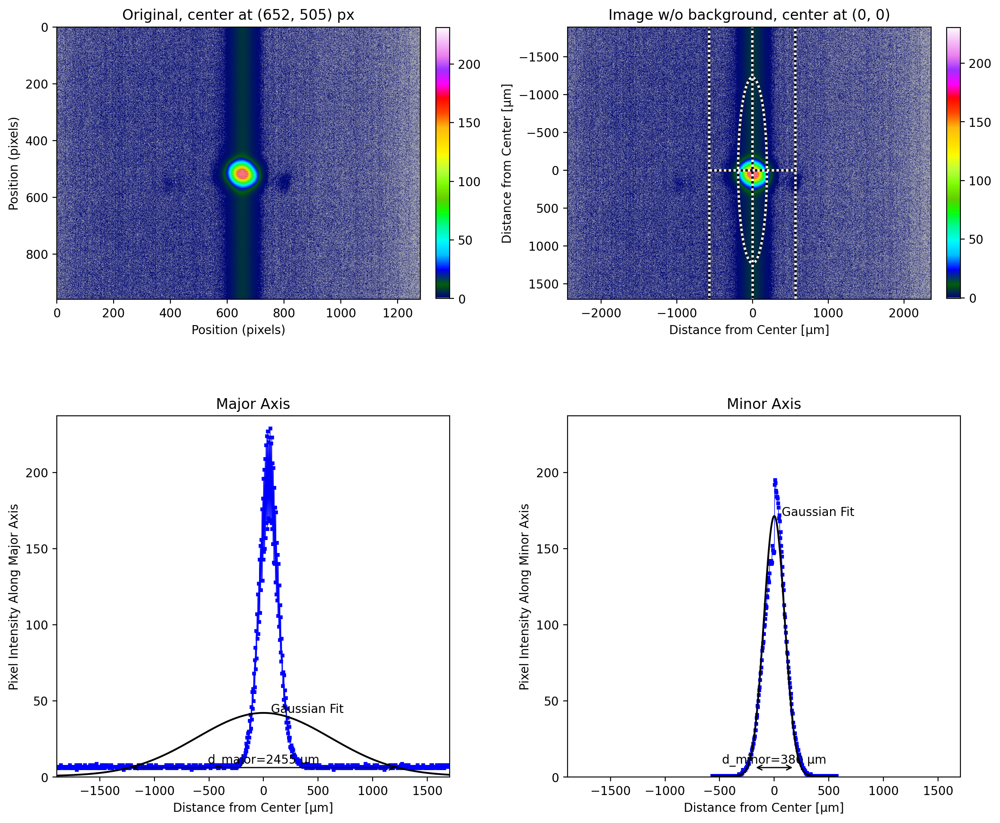

In [8]:
art1_img = iio.imread(repo + "TEM00_150mm.pgm")

options = {
    "pixel_size": pixel_size_µm,
    "units": "µm",
    "iso_noise": True,
    "cmap": "gist_ncar",
}
lbs.plot_image_analysis(art1_img, **options)

Cropping the beam allows a reasonable fit to be obtained.  However, in the image on the top right below, the integration rectangle extends beyond the image.  Thus the result is not ISO 11146 compliant.

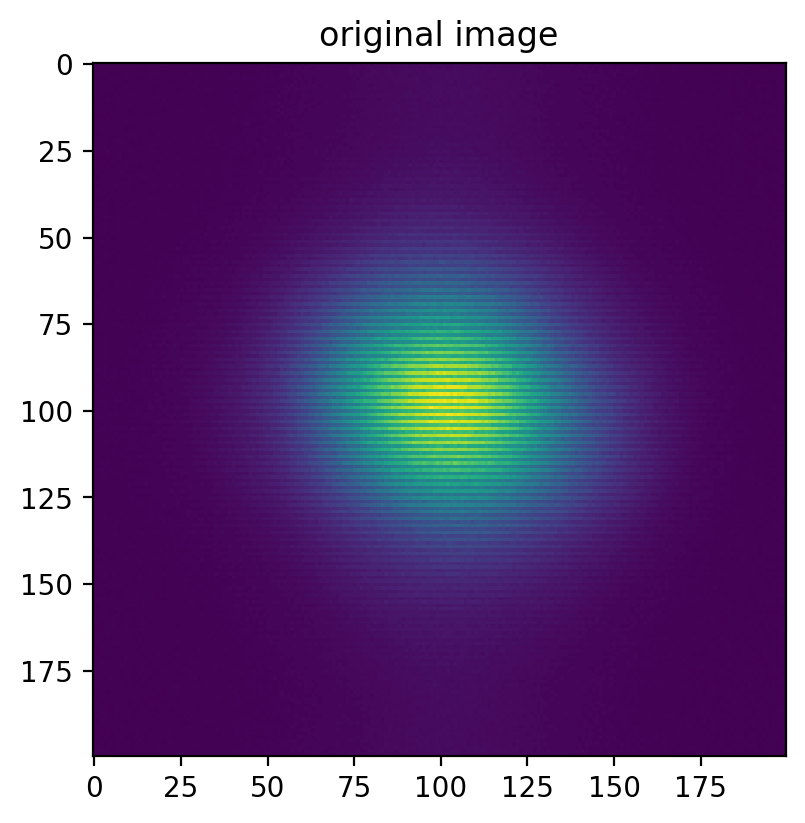

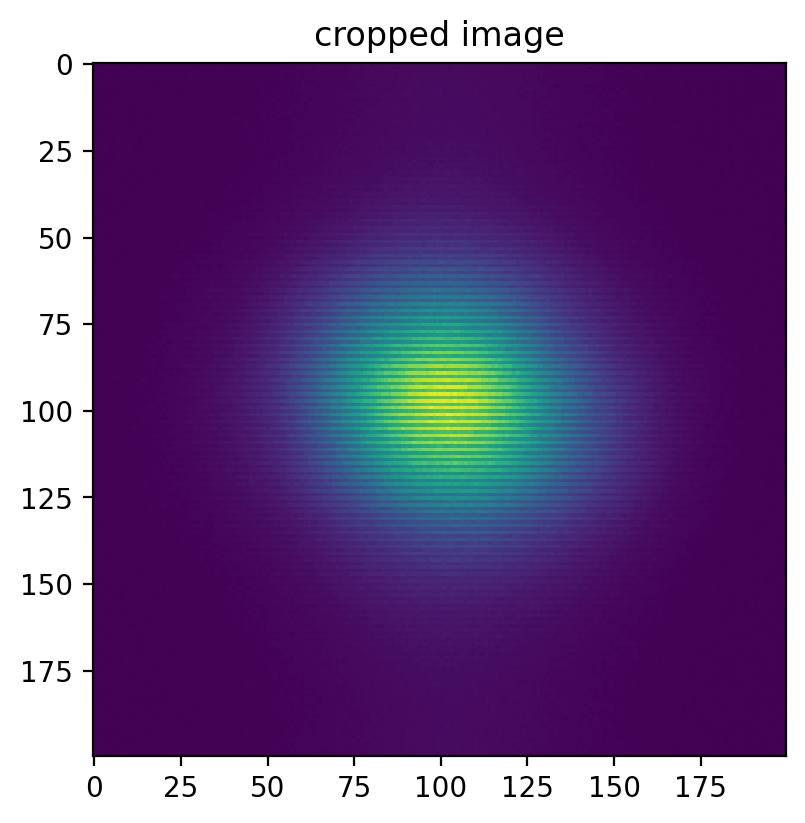

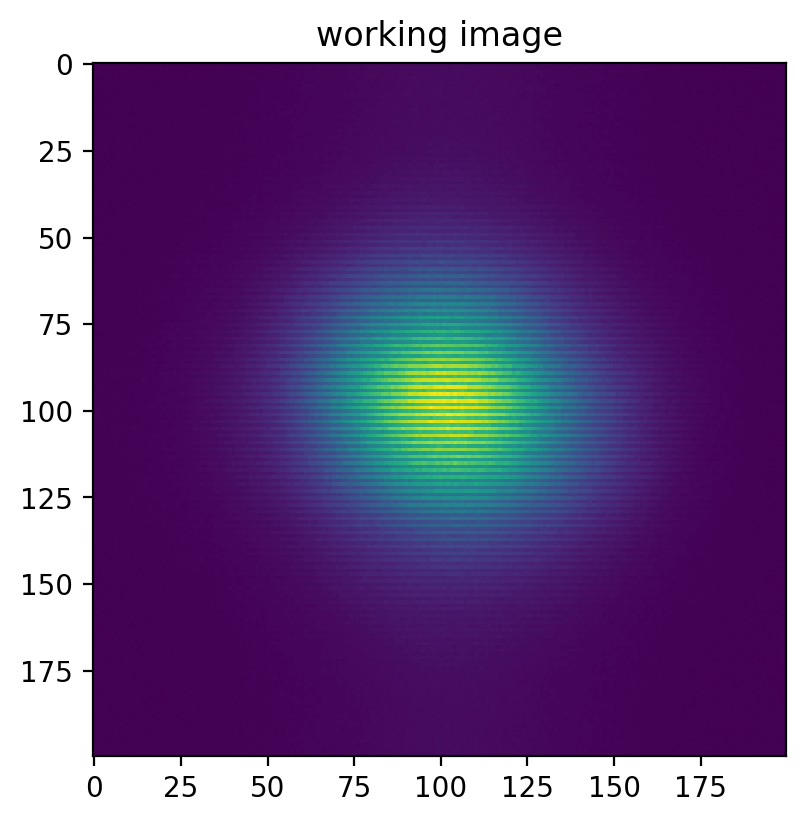

D_MINOR= 100.49188067818127
[ 60.21368893 143.62628993] [-66.45009184 262.87104373] [247.80111366 -43.96113481] [ 61.26075515 135.16019673]
[-156.39862688  156.39862688] [-617.47712918  617.47712918]
[ 547.05421588 -547.05421588] [-138.56145296  138.56145296]
[  4.   4.   5.   5.   5.   5.   4.   6.   5.   5.   5.   5.   5.   6.
   6.   6.   5.   5.   5.   6.   6.   6.   7.   7.   7.   8.   7.   9.
   7.   8.   8.  11.   9.  11.  10.  12.  10.  14.  12.  15.  13.  18.
  16.  20.  17.  23.  20.  24.  22.  30.  26.  33.  29.  39.  33.  46.
  39.  52.  42.  59.  48.  65.  55.  76.  59.  85.  68.  94.  75. 108.
  82. 113.  90. 130. 101. 138. 111. 149. 117. 161. 123. 173. 137. 186.
 142. 190. 148. 205. 153. 209. 159. 213. 159. 217. 169. 222. 171. 220.
 168. 223. 162. 225. 169. 226. 162. 220. 157. 210. 160. 196. 142. 192.
 135. 183. 131. 167. 122. 157. 117. 148. 100. 129.  96. 126.  86. 110.
  77. 102.  73.  87.  69.  80.  62.  72.  51.  62.  46.  57.  42.  49.
  36.  43.  29.  37.  28.  33.

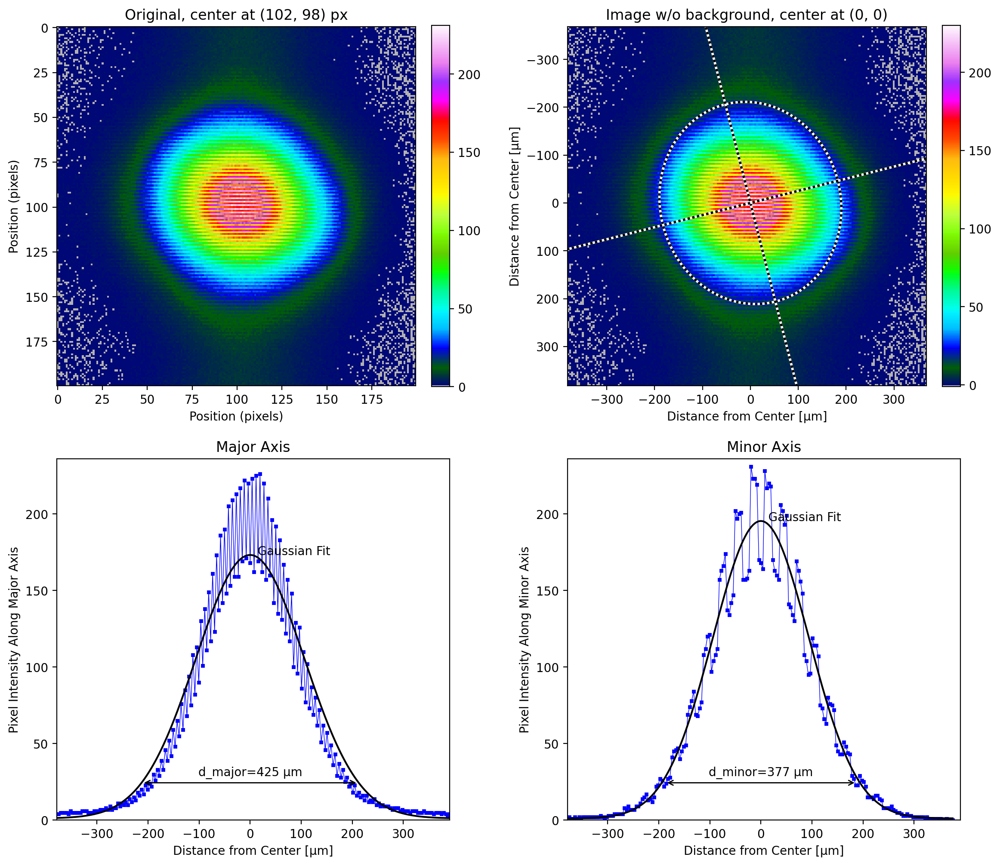

In [9]:
options = {
    "pixel_size": pixel_size_µm,
    "units": "µm",
    "iso_noise": True,
    "cmap": "gist_ncar",
}
lbs.plot_image_analysis(art1_img[420:620, 550:750], **options)

## Image has artifacts, 2

Here a small artifact above the primary beam image (perhaps a reflection) dramatically changes the vertical beam diameter.

We even turn off iso_noise so that the sloping background is removed.

(960, 1280)


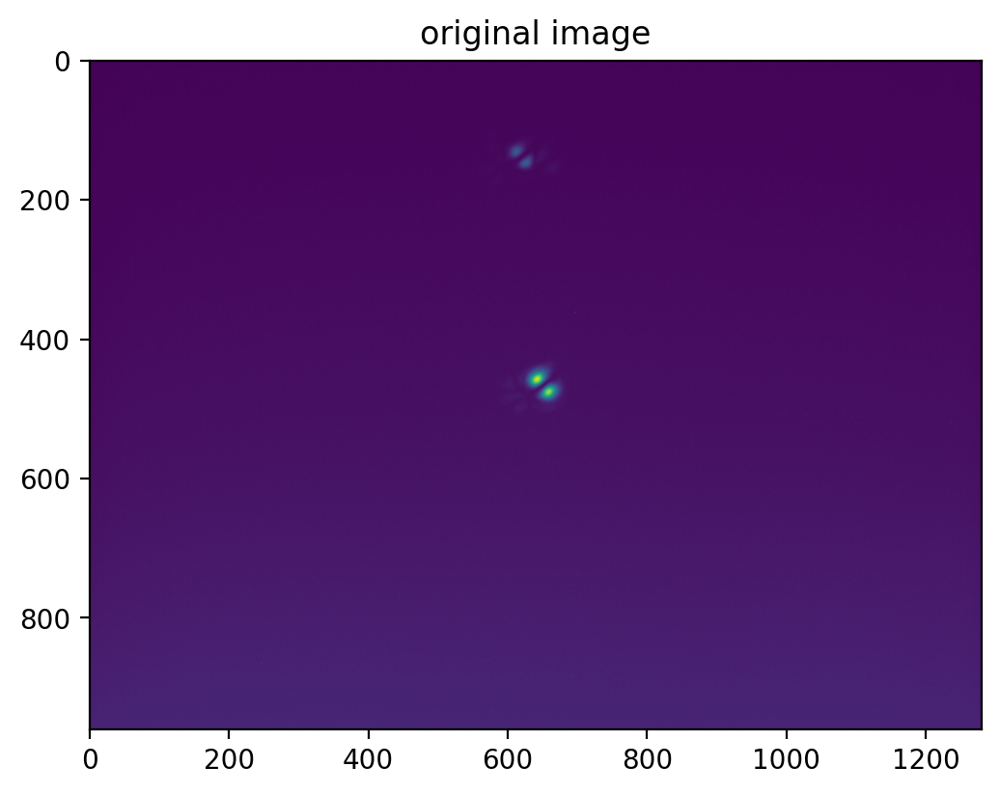

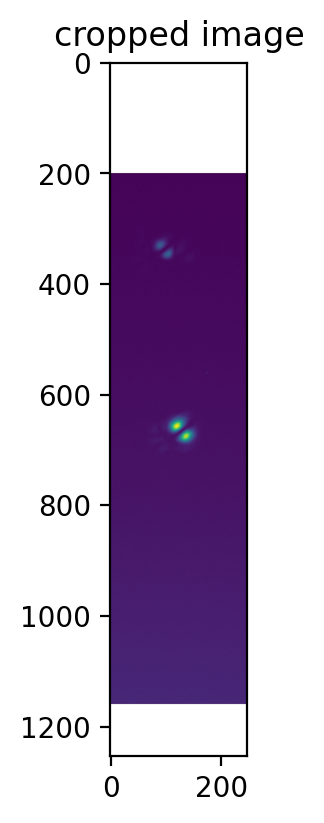

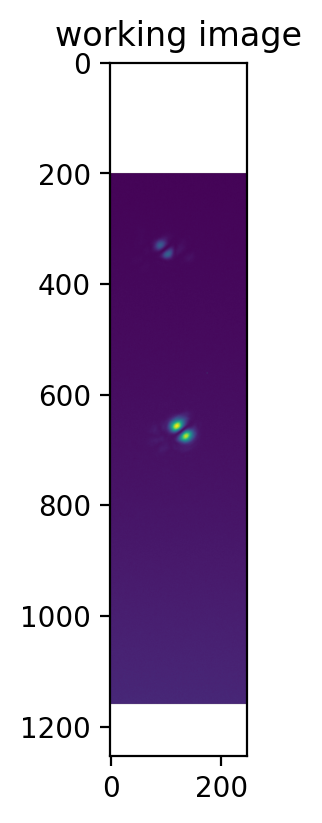

D_MINOR= 41.427189181916525
[ 62.00536409 186.63616307] [   6.25968034 1246.76797664] [185.90153801  62.73998914] [620.32696046 632.70069652]
[-233.68274809  233.68274809] [-2325.95305557  2325.95305557]
[ 230.92790413 -230.92790413] [-23.20075511  23.20075511]
[ 1552.  1584.  1840.  1840.  1408.  1872.  1552.  1568.  1424.  2048.
  1904.  1776.  1456.  1968.  1760.  1408.  1712.  1664.  1968.  1856.
  1504.  1888.  1712.  1792.  1568.  1520.  1840.  1712.  1744.  1840.
  1648.  1776.  1792.  1840.  1712.  1680.  1888.  1632.  1680.  1680.
  1984.  1712.  1760.  1472.  1936.  1920.  1856.  1536.  1600.  1712.
  1968.  1808.  1552.  1856.  2032.  2096.  1856.  1920.  1568.  1904.
  1760.  1936.  1872.  1824.  1472.  1840.  1840.  1776.  2080.  2192.
  1728.  1760.  1984.  1872.  2160.  1952.  2304.  1808.  2032.  1968.
  2032.  1568.  2208.  2160.  2032.  1696.  1760.  2384.  1856.  1808.
  2016.  1936.  1856.  2432.  2128.  1968.  1728.  1632.  1728.  2000.
  1936.  1952.  2176.  2064.

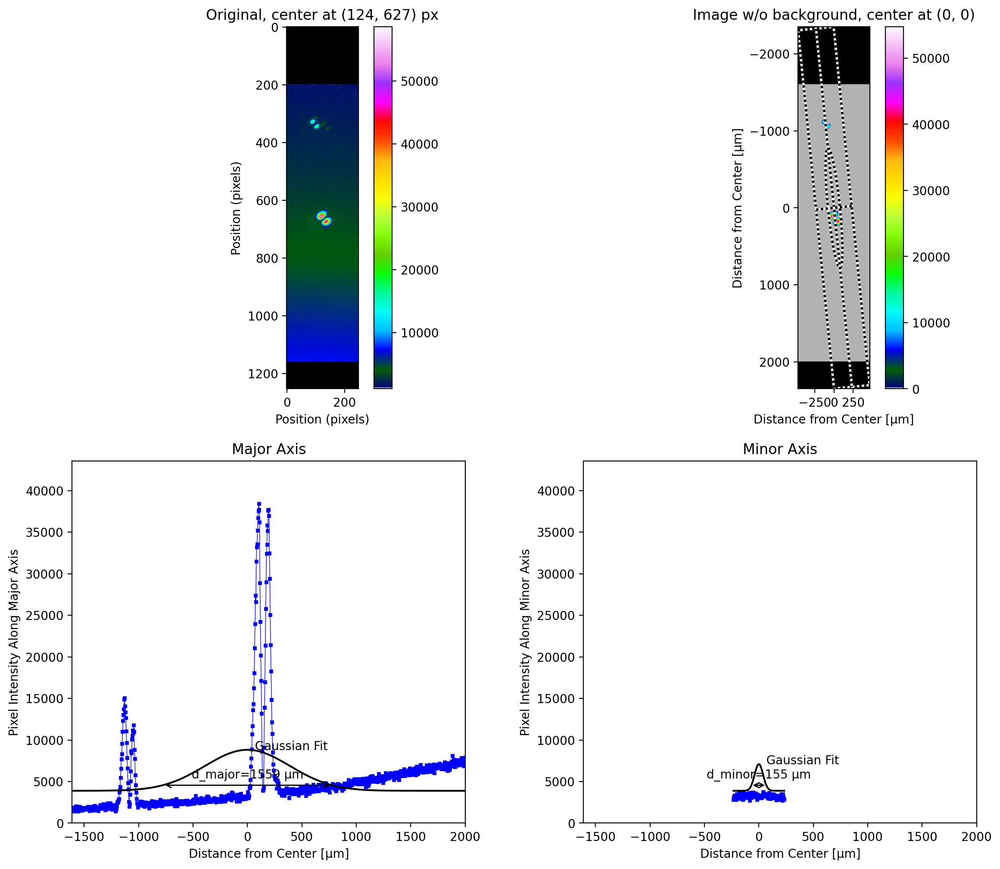

In [10]:
options = {"pixel_size": pixel_size_µm, "units": "µm", "cmap": "gist_ncar", "iso_noise": False, "crop": True}
art2_img = iio.imread(repo + "sb_259mm_10.pgm")
print(art2_img.shape)
lbs.plot_image_analysis(art2_img, **options)

Cropping the image produces much more reasonable values for the diameters.

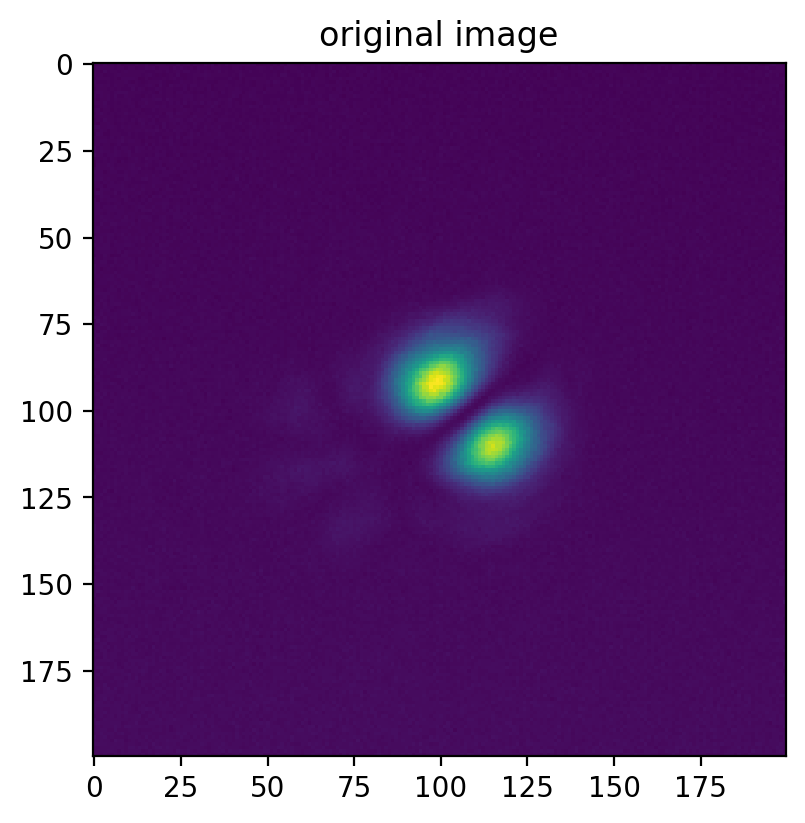

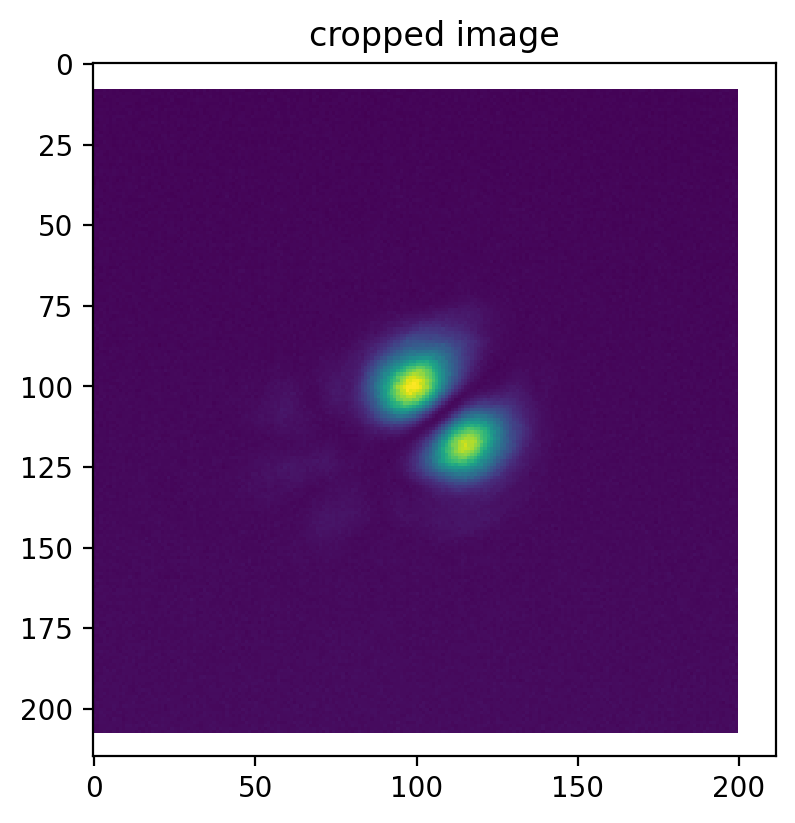

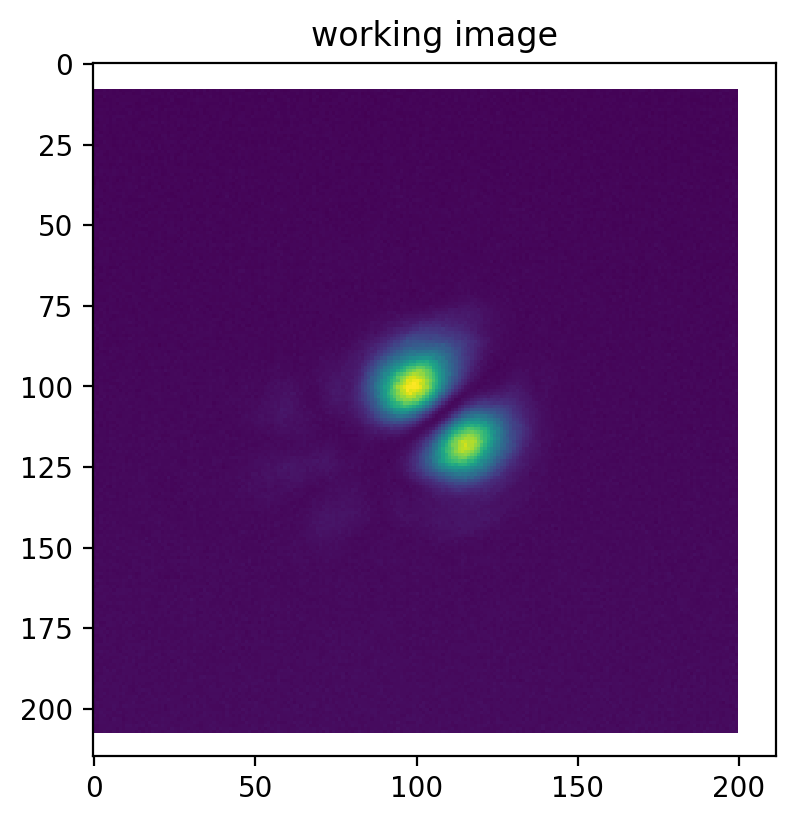

D_MINOR= 39.4975887323295
[ 44.65067943 168.20838003] [ 39.60101688 175.1752338 ] [150.03391146  62.825148  ] [ 67.64858441 147.12766626]
[-231.67068861  231.67068861] [-254.20165673  254.20165673]
[ 163.51643147 -163.51643147] [-149.02327847  149.02327847]
[ 2960.  3248.  2928.  3136.  3072.  3072.  2960.  3056.  3248.  3696.
  3312.  3072.  3072.  2848.  3040.  3168.  3552.  2960.  2816.  3232.
  3184.  2912.  2880.  2976.  3056.  3008.  3680.  3248.  3104.  3648.
  3328.  3552.  3376.  3312.  3552.  3184.  3184.  3344.  3184.  3280.
  3440.  3392.  3872.  3472.  4128.  4880.  5488.  6256.  8416. 10000.
 12624. 14576. 19664. 23056. 27696. 31792. 38128. 44704. 52384. 55520.
 58608. 57920. 53264. 51216. 43264. 36464. 24480. 15328.  7952.  3920.
  4528.  8944. 16032. 24848. 30784. 37904. 44560. 49200. 53008. 51584.
 51280. 45216. 39296. 32912. 27968. 25728. 20864. 17024. 12640.  9664.
  7616.  6768.  5488.  4608.  4496.  4480.  4544.  4304.  4032.  4160.
  3520.  3552.  3376.  3632.  38

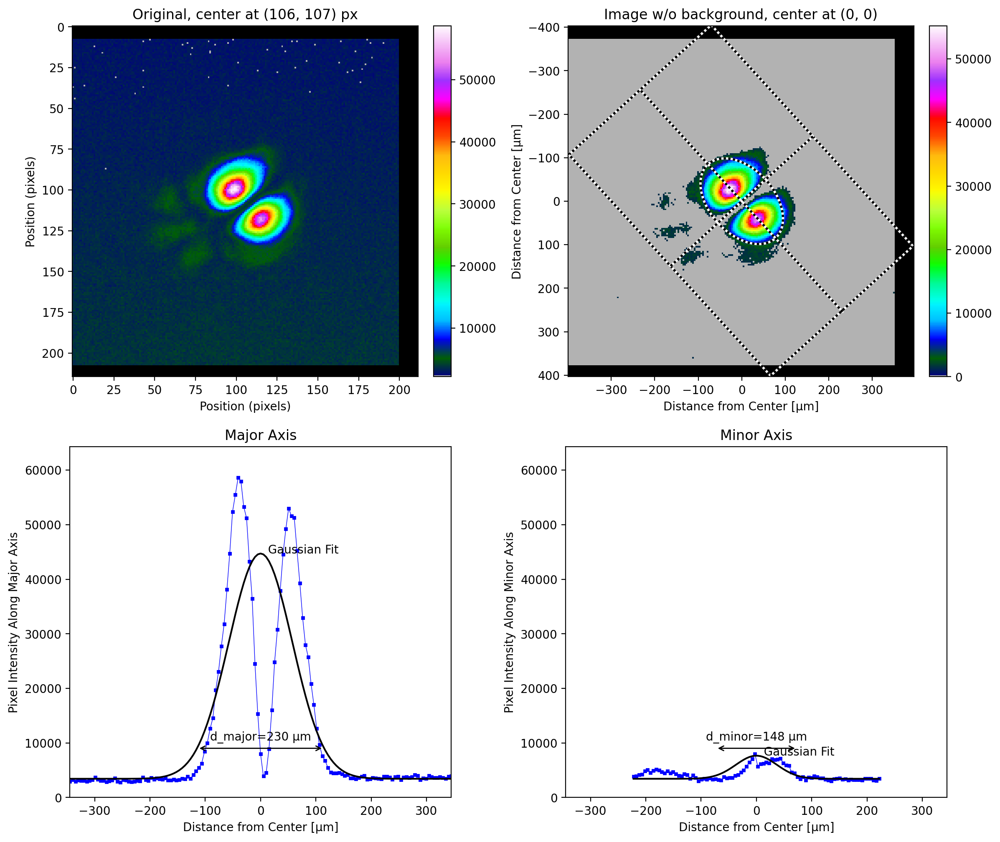

In [12]:
lbs.plot_image_analysis(art2_img[365:565, 543:743], **options)

## Image of beam has too much noise

The background is nearly half of the central beam intensity.  Although subtracting the background kind of worked, the offset affects the fitted gaussian and makes the diameter too wide.  In this case, assuming `iso_noise=True` fails but when turned off, a reasonable fit is achieved.

In [ ]:
noise_img = iio.imread(repo + "k-800mm.png")
options = {
    "pixel_size": pixel_size_µm,
    "units": "µm",
    "cmap": lbs.create_plus_minus_cmap(noise_img),
}
lbs.plot_image_analysis(noise_img, **options, iso_noise=True)
lbs.plot_image_analysis(noise_img, **options, iso_noise=False)